<a href="https://colab.research.google.com/github/serbinaekaterinai/AI-Driven-Platform/blob/main/Project_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **FashionViz** an AI-Driven Fashion Recommendation Platform

FashionViz is an innovative platform that integrates AI-driven fashion recommendations, immersive shopping experiences, and cutting-edge technologies such as Augmented Reality (AR) and Virtual Reality (VR) into the e-commerce landscape. This repository and documentation provide insights into the various aspects, methodologies, and technologies leveraged by FashionViz to enhance customer engagement and drive sales within the fashion retail industry.

This platform is designed to revolutionize the way customers interact with and purchase fashion products online. With the surge in online shopping and the growing potential of the global e-commerce market, FashionViz aims to provide a highly personalized and immersive shopping experience to meet the evolving demands of modern consumers.



## Data Overview

The dataset utilized by FashionViz is sourced from Kaggle.com and comprises two main components: a CSV file containing mapping details for various products within the fashion dataset, and an image folder housing over 44.4k high-resolution images (2400x1600) of fashion products.


## Technological Integration in E-commerce

FashionViz strategically integrates technologies such as Augmented Reality (AR), Virtual Reality (VR), and AI-driven recommendations to address the challenges of enhancing customer engagement and driving sales within the highly competitive e-commerce landscape.

This convergence of technology and consumer-driven experiences offers substantial opportunities for tech firms, retailers, and brands to enhance their market presence and engagement. FashionViz's innovative approach involves various stakeholders, including tech firms seeking innovation, fashion retailers and brands striving to enhance customer engagement and sales, as well as consumers seeking immersive and personalized shopping experiences in the e-commerce space.



## Downloading and Extracting Dataset from Kaggle


In [3]:
# Importing TensorFlow and Installing Kaggle Package
import tensorflow as tf
!pip install kaggle

In [4]:
# Mounting Google Drive in Google Colab
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
# Configuring Kaggle Authentication in Google Colab
! mkdir ~/.kaggle/
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
# Downloading Fashion Product Images Dataset from Kaggle
! kaggle datasets download -d paramaggarwal/fashion-product-images-dataset

100% 23.1G/23.1G [10:45<00:00, 36.0MB/s]
100% 23.1G/23.1G [10:45<00:00, 38.4MB/s]


In [7]:
# Creating Directory and Unzipping Fashion Product Images Dataset
! mkdir fashion_products
! unzip /content/fashion-product-images-dataset.zip -d fashion_products

Streaming output truncated to the last 5000 lines.
  inflating: fashion_products/fashion-dataset/styles/58128.json  
  inflating: fashion_products/fashion-dataset/styles/58129.json  
  inflating: fashion_products/fashion-dataset/styles/5813.json  
  inflating: fashion_products/fashion-dataset/styles/58131.json  
  inflating: fashion_products/fashion-dataset/styles/58132.json  
  inflating: fashion_products/fashion-dataset/styles/58133.json  
  inflating: fashion_products/fashion-dataset/styles/58135.json  
  inflating: fashion_products/fashion-dataset/styles/58136.json  
  inflating: fashion_products/fashion-dataset/styles/58137.json  
  inflating: fashion_products/fashion-dataset/styles/58138.json  
  inflating: fashion_products/fashion-dataset/styles/58139.json  
  inflating: fashion_products/fashion-dataset/styles/5814.json  
  inflating: fashion_products/fashion-dataset/styles/58140.json  
  inflating: fashion_products/fashion-dataset/styles/58141.json  
  inflating: fashion_produc

In [8]:
# Mounting Google Drive in Google Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing Packages

In [9]:
import cv2
from collections import Counter
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pathlib
from pathlib import Path
import PIL
import PIL.Image
import plotly.express as px
import plotly.offline as pyo
from sklearn.model_selection import train_test_split
import shutil
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Flatten, GlobalAveragePooling2D, MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.metrics import F1Score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.activations import swish
from tensorflow.keras.applications import ResNet50
from keras.applications import MobileNet
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras import layers, models, optimizers

pyo.init_notebook_mode()



# Loading Data

In [10]:
images_df=pd.read_csv('fashion_products/fashion-dataset/images.csv')
images_df

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...
1,39386.jpg,http://assets.myntassets.com/v1/images/style/p...
2,59263.jpg,http://assets.myntassets.com/v1/images/style/p...
3,21379.jpg,http://assets.myntassets.com/v1/images/style/p...
4,53759.jpg,http://assets.myntassets.com/v1/images/style/p...
...,...,...
44441,17036.jpg,http://assets.myntassets.com/v1/images/style/p...
44442,6461.jpg,http://assets.myntassets.com/v1/images/style/p...
44443,18842.jpg,http://assets.myntassets.com/v1/images/style/p...
44444,46694.jpg,http://assets.myntassets.com/v1/images/style/p...


In [11]:
styles_df=pd.read_csv('fashion_products/fashion-dataset/styles.csv', on_bad_lines='skip')
styles_df

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt
...,...,...,...,...,...,...,...,...,...,...
44419,17036,Men,Footwear,Shoes,Casual Shoes,White,Summer,2013.0,Casual,Gas Men Caddy Casual Shoe
44420,6461,Men,Footwear,Flip Flops,Flip Flops,Red,Summer,2011.0,Casual,Lotto Men's Soccer Track Flip Flop
44421,18842,Men,Apparel,Topwear,Tshirts,Blue,Fall,2011.0,Casual,Puma Men Graphic Stellar Blue Tshirt
44422,46694,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,Casual,Rasasi Women Blue Lady Perfume


# Exploratory Data Analysis



### Gender Distribution

In [12]:
styles_df.gender.value_counts()

Men       22147
Women     18631
Unisex     2161
Boys        830
Girls       655
Name: gender, dtype: int64

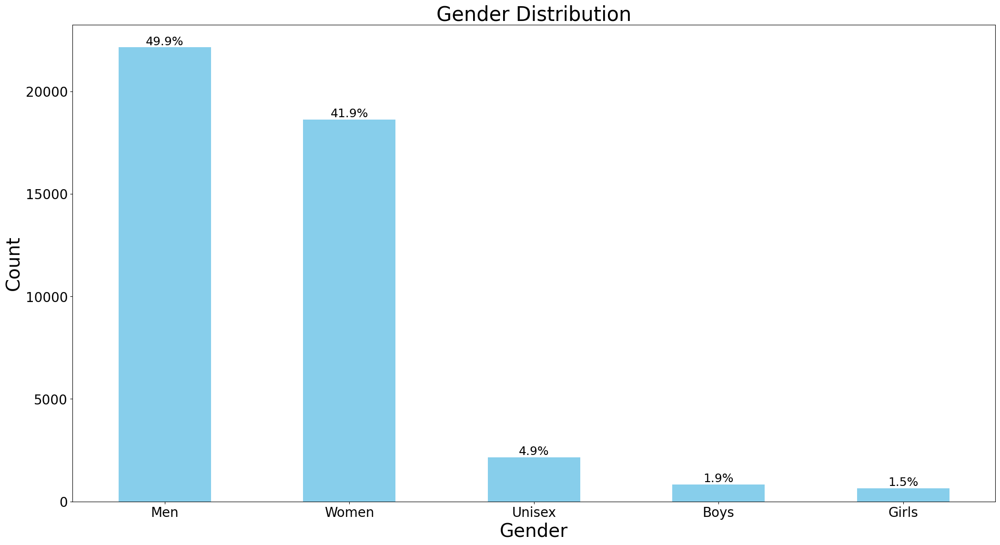

In [13]:
# Creating a bar chart
gender_counts = styles_df['gender'].value_counts()
plt.figure(figsize=(25, 13))
ax = gender_counts.plot(kind='bar', color=['skyblue'])
plt.title('Gender Distribution', fontsize=30)
plt.xlabel('Gender', fontsize=28)
plt.ylabel('Count', fontsize=28)
plt.xticks(rotation=0, fontsize=20)
plt.yticks(rotation=0, fontsize=20)

# Adding percentage annotations on the bars
total = len(styles_df['gender'])
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom', fontsize=18)

plt.show()

The 'gender' column in the dataset shows the distribution of products across various gender categories.
It indicates the number of products available for each gender category. The categories include 'Men', 'Women', 'Unisex', ' 'Boys', and 'Girls'.
Among the products, the 'Men' category has the highest count with 22,147 products, followed by 'Women' with 18,631 products.
Additionally, there are 2,161 products listed under 'Unisex', 830 under 'Boys', and 655 under 'Girls'.


### Distribution of Categories

In [14]:
styles_df.masterCategory.value_counts()

Apparel           21397
Accessories       11274
Footwear           9219
Personal Care      2403
Free Items          105
Sporting Goods       25
Home                  1
Name: masterCategory, dtype: int64

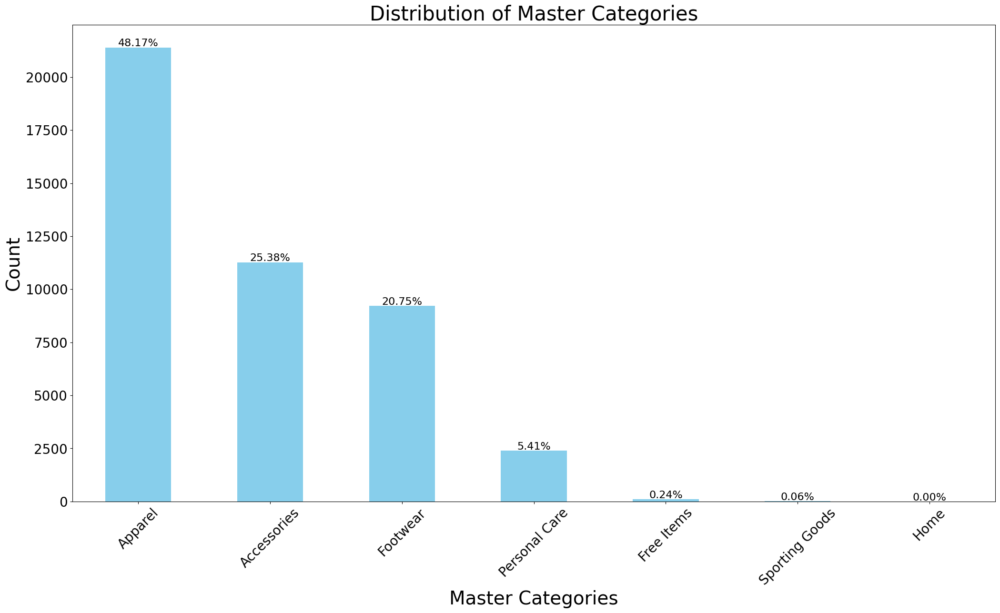

In [15]:
category_counts = styles_df['masterCategory'].value_counts()
# Creating a bar chart
plt.figure(figsize=(25, 13))
ax = category_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Master Categories', fontsize=30)
plt.xlabel('Master Categories', fontsize=28)
plt.ylabel('Count', fontsize=28)
plt.xticks(rotation=45, fontsize=20)
plt.yticks(rotation=0, fontsize=20)

# Calculating percentages and annotate the bars
total = len(styles_df['masterCategory'])
for i in ax.patches:
    height = i.get_height()
    ax.text(i.get_x() + i.get_width() / 2, height + 50, f'{height/total:.2%}', ha='center', fontsize=16)

plt.show()

### Distribution of Master Categories

- **Apparel:** Represents a substantial portion of the dataset with 21,397 items, indicating a significant presence of clothing products.
- **Accessories:** Features a considerable count of 11,274 items, likely comprising a range of complementary products like jewelry, bags, and others.
- **Footwear:** With 9,219 items, this category represents various types of footwear available in the dataset.
- **Personal Care:** Contains a smaller quantity of items (2,403) which may consist of products like skincare, cosmetics, and personal hygiene items.
- **Free Items:** A minor category with a count of 105 items, potentially comprising products offered for free.
- **Sporting Goods:** Limited to 25 items, signifying a small range of sports-related products.
- **Home:** Least represented in the dataset with just 1 item, indicating a minimal representation of home-related items.

The 'masterCategory' data provides a broad overview of the types of products cataloged in this dataset, with apparel, accessories, and footwear being the most prevalent categories.


In [16]:
styles_df.subCategory.value_counts()

Topwear                     15402
Shoes                        7343
Bags                         3055
Bottomwear                   2694
Watches                      2542
Innerwear                    1808
Jewellery                    1079
Eyewear                      1073
Fragrance                    1011
Sandal                        963
Wallets                       933
Flip Flops                    913
Belts                         811
Socks                         698
Lips                          527
Dress                         478
Loungewear and Nightwear      470
Saree                         427
Nails                         329
Makeup                        307
Headwear                      293
Ties                          258
Accessories                   129
Scarves                       118
Cufflinks                     108
Apparel Set                   106
Free Gifts                    104
Stoles                         90
Skin Care                      77
Skin          

In [17]:
subcat_by_mastercat = styles_df.groupby('masterCategory')['subCategory'].apply(set)
print(subcat_by_mastercat)

masterCategory
Accessories       {Socks, Umbrellas, Cufflinks, Scarves, Belts, ...
Apparel           {Socks, Apparel Set, Saree, Dress, Topwear, In...
Footwear                                {Shoes, Sandal, Flip Flops}
Free Items                                   {Free Gifts, Vouchers}
Home                                              {Home Furnishing}
Personal Care     {Hair, Nails, Lips, Bath and Body, Makeup, Ski...
Sporting Goods                       {Wristbands, Sports Equipment}
Name: subCategory, dtype: object


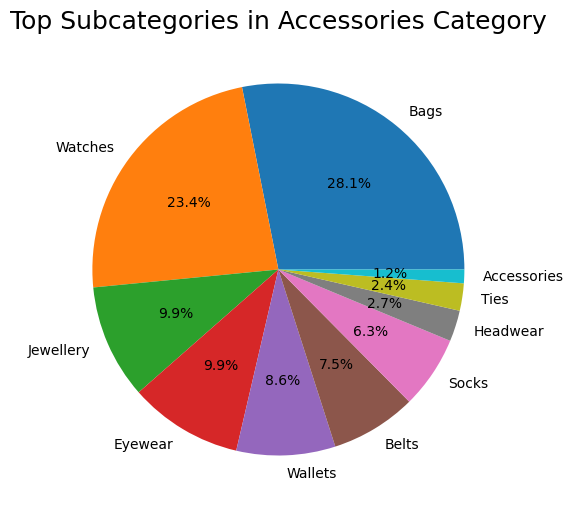

In [18]:
# Creating Pie Chart
accessories_data = styles_df[styles_df['masterCategory'] == 'Accessories']
accessories_subcategory_counts = accessories_data['subCategory'].value_counts().nlargest(10)

plt.figure(figsize=(6, 13))
accessories_subcategory_counts.plot(kind='pie', autopct='%1.1f%%')
plt.title('Top Subcategories in Accessories Category', fontsize=18)
plt.ylabel('')
plt.show()

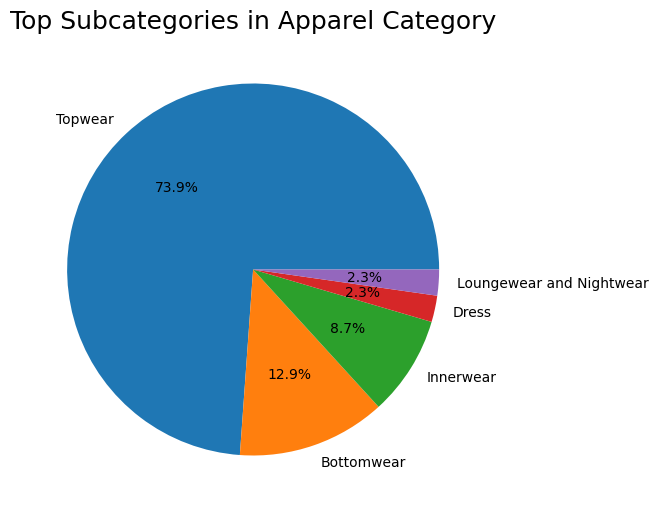

In [19]:
# Creating Pie Chart
accessories_data = styles_df[styles_df['masterCategory'] == 'Apparel']
accessories_subcategory_counts = accessories_data['subCategory'].value_counts().nlargest(5)

plt.figure(figsize=(6, 13))
accessories_subcategory_counts.plot(kind='pie', autopct='%1.1f%%')
plt.title('Top Subcategories in Apparel Category', fontsize=18)
plt.ylabel('')
plt.show()

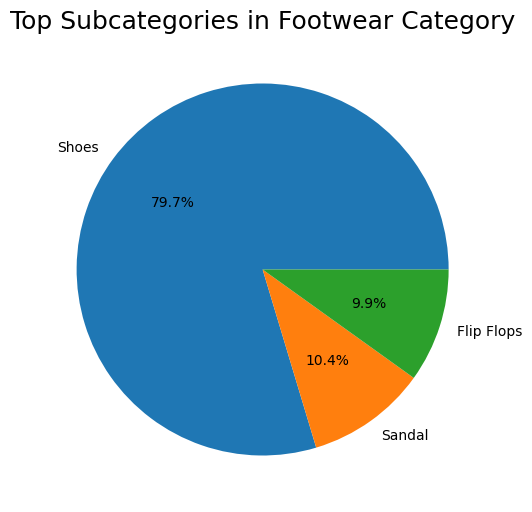

In [20]:
# Creating Pie Chart
accessories_data = styles_df[styles_df['masterCategory'] == 'Footwear']
accessories_subcategory_counts = accessories_data['subCategory'].value_counts().nlargest(3)

plt.figure(figsize=(6, 13))
accessories_subcategory_counts.plot(kind='pie', autopct='%1.1f%%')
plt.title('Top Subcategories in Footwear Category', fontsize=18)
plt.ylabel('')
plt.show()

In [21]:
styles_df.articleType.value_counts()

Tshirts                7067
Shirts                 3217
Casual Shoes           2845
Watches                2542
Sports Shoes           2036
                       ... 
Shoe Laces                1
Mens Grooming Kit         1
Body Wash and Scrub       1
Suits                     1
Ipad                      1
Name: articleType, Length: 143, dtype: int64

In [22]:
art_by_sub = styles_df.groupby('subCategory')['articleType'].apply(set)
print(art_by_sub)

subCategory
Accessories                 {Travel Accessory, Hair Accessory, Key chain, ...
Apparel Set                              {Swimwear, Kurta Sets, Clothing Set}
Bags                        {Clutches, Travel Accessory, Wallets, Trolley ...
Bath and Body               {Body Lotion, Body Wash and Scrub, Nail Essent...
Beauty Accessories                                         {Beauty Accessory}
Belts                                                        {Tshirts, Belts}
Bottomwear                  {Shorts, Leggings, Patiala, Salwar, Salwar and...
Cufflinks                                     {Cufflinks, Ties and Cufflinks}
Dress                                                     {Jumpsuit, Dresses}
Eyes                                 {Kajal and Eyeliner, Eyeshadow, Mascara}
Eyewear                                                          {Sunglasses}
Flip Flops                                                       {Flip Flops}
Fragrance                   {Deodorant, Fragrance Gi

### Seasons Distribution

In [23]:
styles_df.season.value_counts()

Summer    21472
Fall      11431
Winter     8517
Spring     2983
Name: season, dtype: int64

In [24]:
season_percentage = (styles_df['season'].value_counts(normalize=True) * 100).round(2)


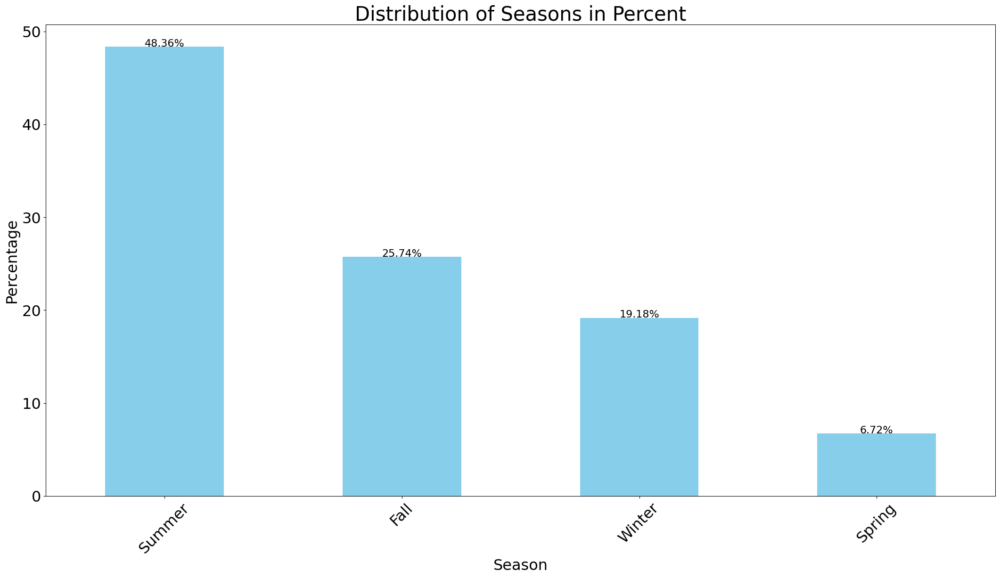

In [25]:
# Creating a bar chart
plt.figure(figsize=(26, 13))
bars = season_percentage.plot(kind='bar', color='skyblue', fontsize=23)

# Adding  percentages
for bar, percent in zip(bars.patches, season_percentage):
    bars.annotate(f'{percent}%', (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                  ha='center', va='center', xytext=(0, 5), textcoords='offset points', fontsize=16)

plt.title('Distribution of Seasons in Percent', fontsize=30)
plt.xlabel('Season', fontsize=23)
plt.ylabel('Percentage', fontsize=23)
plt.xticks(rotation=45)
plt.show()

### Distribution of Colors

In [ ]:
styles_df.baseColour.value_counts()

Black                9728
White                5538
Blue                 4918
Brown                3494
Grey                 2741
Red                  2455
Green                2115
Pink                 1860
Navy Blue            1789
Purple               1640
Silver               1090
Yellow                778
Beige                 749
Gold                  628
Maroon                581
Orange                530
Olive                 410
Multi                 394
Cream                 390
Steel                 315
Charcoal              228
Peach                 195
Off White             182
Skin                  179
Lavender              162
Grey Melange          146
Khaki                 139
Magenta               129
Teal                  120
Tan                   114
Mustard                97
Bronze                 95
Copper                 86
Turquoise Blue         69
Rust                   66
Burgundy               45
Metallic               43
Coffee Brown           31
Mauve       

### Distribution of Styles

In [ ]:
styles_df.usage.value_counts()

Casual          34406
Sports           4025
Ethnic           3208
Formal           2345
Smart Casual       67
Party              29
Travel             26
Home                1
Name: usage, dtype: int64

### Distribution of Years

In [ ]:
styles_df['year'] = styles_df['year'].astype(str).str[-4:]


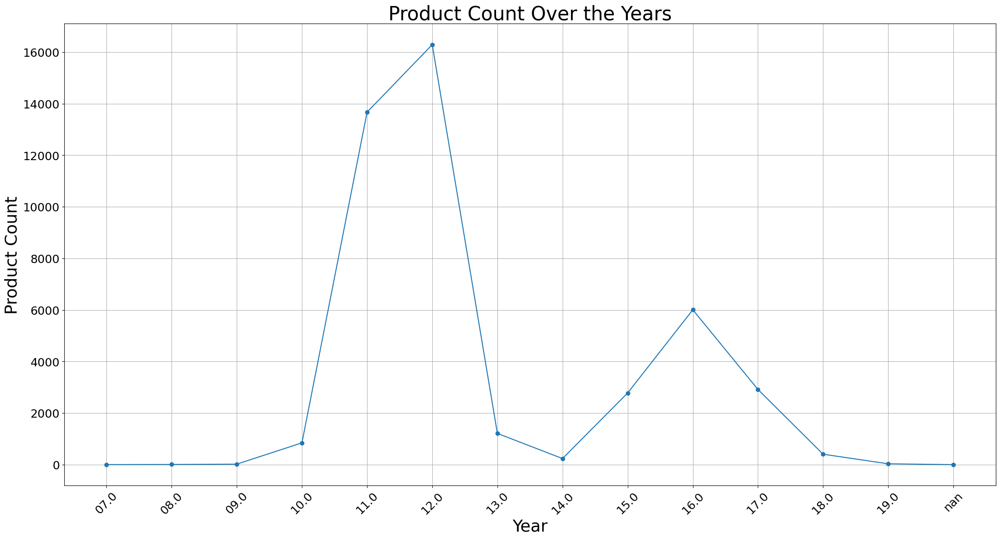

In [ ]:
year_counts = styles_df['year'].value_counts().sort_index()

plt.figure(figsize=(26, 13))
plt.plot(year_counts, marker='o')
plt.title('Product Count Over the Years', fontsize=30)
plt.xlabel('Year', fontsize=26)
plt.ylabel('Product Count', fontsize=26)
plt.xticks(year_counts.index, rotation=45, fontsize=18)
plt.yticks(rotation=0, fontsize=18)
plt.grid(True)
plt.show()

### Men's Fashion Styles by Various Attributes

In [ ]:
men_styles = styles_df[styles_df['gender'] == 'Men']

columns = ['masterCategory', 'subCategory', 'articleType', 'baseColour', 'usage']

for col in columns:
    top_5 = men_styles[men_styles['gender'] == 'Men'][col].value_counts().head(5)
    print(f"Top 5 for '{col}' in Men's styles:")
    print(top_5)
    print('\n')

Top 5 for 'masterCategory' in Men's styles:
Apparel          11352
Footwear          5751
Accessories       4412
Personal Care      579
Free Items          53
Name: masterCategory, dtype: int64


Top 5 for 'subCategory' in Men's styles:
Topwear       8841
Shoes         4477
Watches       1473
Bottomwear    1399
Innerwear      988
Name: subCategory, dtype: int64


Top 5 for 'articleType' in Men's styles:
Tshirts         5243
Shirts          2844
Casual Shoes    2247
Sports Shoes    1590
Watches         1473
Name: articleType, dtype: int64


Top 5 for 'baseColour' in Men's styles:
Black    5881
White    3102
Blue     2676
Brown    1951
Grey     1810
Name: baseColour, dtype: int64


Top 5 for 'usage' in Men's styles:
Casual          16769
Sports           2954
Formal           2235
Ethnic            107
Smart Casual       54
Name: usage, dtype: int64




- Apparel and Footwear are the dominant categories among Men's styles, significantly more popular compared to Accessories, Personal Care, and Free Items
- Topwear, including T-shirts and shirts, stands out as the most prevalent subcategory. This suggests a high demand for upper body clothing. Additionally, shoes are quite popular among Men's styles.
- The popularity of black, white, and blue color preferences indicates a significant trend. Neutral tones and versatile shades dominate, with black being the most prevalent choice for men's fashion.
- The highest usage category is 'Casual', followed by 'Sports'. It's evident that casual and sportswear are among the most popular usage choices for men, reflecting a preference for everyday comfort.

### Women's Fashion Styles by Various Attributes

In [ ]:
women_styles = styles_df[styles_df['gender'] == 'Women']

columns = ['masterCategory', 'subCategory', 'articleType', 'baseColour', 'usage']

for col in columns:
    top_5 = women_styles[women_styles['gender'] == 'Women'][col].value_counts().head(5)
    print(f"Top 5 for '{col}' in Women's styles:")
    print(top_5)
    print('\n')

Top 5 for 'masterCategory' in Women's styles:
Apparel          8623
Accessories      5320
Footwear         2836
Personal Care    1809
Free Items         43
Name: masterCategory, dtype: int64


Top 5 for 'subCategory' in Women's styles:
Topwear       5499
Shoes         2555
Bags          2071
Bottomwear    1044
Jewellery     1014
Name: subCategory, dtype: int64


Top 5 for 'articleType' in Women's styles:
Kurtas      1761
Handbags    1689
Tops        1532
Heels       1322
Tshirts     1116
Name: articleType, dtype: int64


Top 5 for 'baseColour' in Women's styles:
Black    2949
White    2029
Blue     1718
Pink     1488
Brown    1400
Name: baseColour, dtype: int64


Top 5 for 'usage' in Women's styles:
Casual    14366
Ethnic     3083
Sports      765
Formal      109
Party        27
Name: usage, dtype: int64




- Apparel and Accessories stand out as the most favored categories among Women's styles, followed by Footwear and Personal Care. Free Items are the least prevalent among these categories.
- Topwear, Shoes, Bags, Bottomwear, and Jewellery appear as the top 5 subcategories.
- Kurtas and Handbags are the top article types for women, followed by tops, heels, and T-shirts.
-  The most preferred base colors for women's styles include black, white, blue, pink, and brown. It signifies a penchant for versatile, neutral colors like black and white, along with shades of blue, pink, and brown.
-  Casual usage is the most predominant among Women's styles, followed by ethnic wear. Sports, formal, and party categories appear less prevalent in women's fashion.

# Loading Image Data

In [26]:
# Displaying List of Files in the Image Directory
File_PATH = 'fashion_products/fashion-dataset/images/'
print(os.listdir(File_PATH))

['23831.jpg', '51348.jpg', '10252.jpg', '8163.jpg', '12797.jpg', '25790.jpg', '15714.jpg', '29576.jpg', '23513.jpg', '12844.jpg', '58591.jpg', '55978.jpg', '19230.jpg', '17202.jpg', '27525.jpg', '29939.jpg', '49580.jpg', '35589.jpg', '12792.jpg', '44880.jpg', '45013.jpg', '50667.jpg', '39137.jpg', '14650.jpg', '52944.jpg', '22750.jpg', '22787.jpg', '43152.jpg', '15806.jpg', '56090.jpg', '7027.jpg', '30309.jpg', '36992.jpg', '15945.jpg', '39820.jpg', '37085.jpg', '38206.jpg', '34212.jpg', '23966.jpg', '48652.jpg', '48229.jpg', '22722.jpg', '6225.jpg', '22236.jpg', '43963.jpg', '20888.jpg', '20493.jpg', '35543.jpg', '32857.jpg', '24407.jpg', '7299.jpg', '14622.jpg', '22290.jpg', '56013.jpg', '32257.jpg', '12149.jpg', '3833.jpg', '47180.jpg', '22778.jpg', '44222.jpg', '18710.jpg', '9589.jpg', '8011.jpg', '13300.jpg', '14863.jpg', '19687.jpg', '49985.jpg', '35325.jpg', '24241.jpg', '47133.jpg', '48092.jpg', '35213.jpg', '8118.jpg', '30047.jpg', '35913.jpg', '44427.jpg', '57023.jpg', '21311

In [27]:
# Displaying List of Files in the CSV Directory
CSV_PATH = 'fashion_products/fashion-dataset'
print(os.listdir(CSV_PATH))

['images.csv', 'styles.csv', 'styles', 'fashion-dataset', 'images']


In [28]:
# Creating Image List from CSV Directory
data_dir = pathlib.Path(CSV_PATH)
images = list(data_dir.glob('*/*.jpg'))

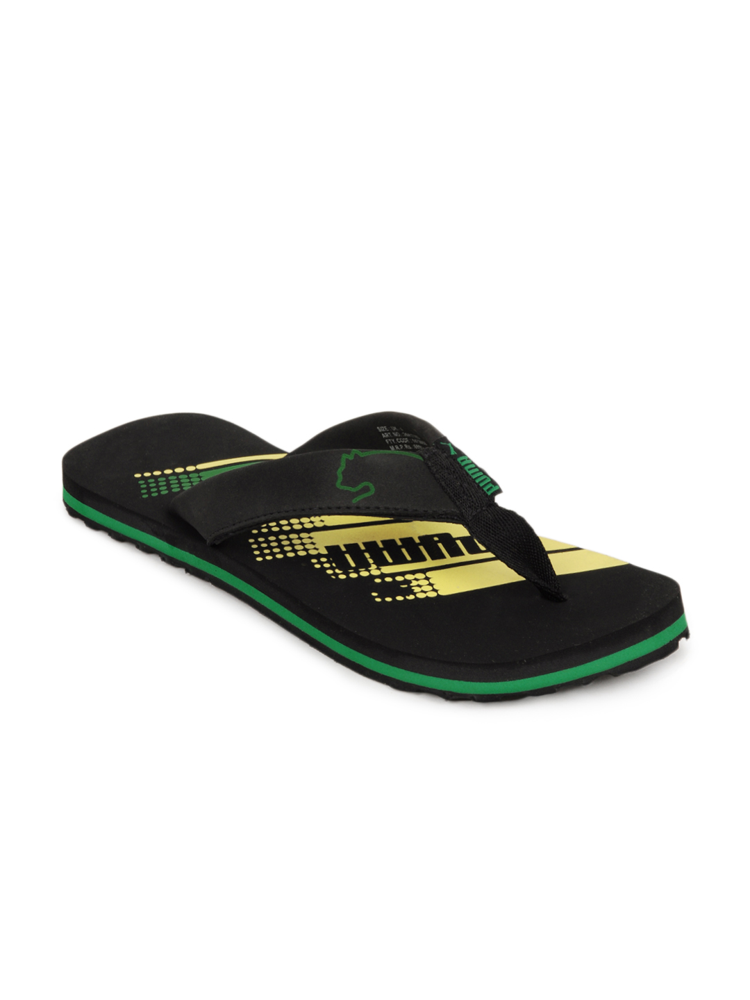

In [29]:
# Displaying the First Image from the List
PIL.Image.open(str(images[0]))

In [30]:
# Creating Image Paths for Styles Data: Associating File Paths with IDs
styles_df['image'] = styles_df.apply(lambda row: os.path.join(CSV_PATH, 'images', str(row['id']) + ".jpg"), axis=1)
styles_df.head()
styles_df.sort_values(by='id').reset_index(drop=True)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,image
0,1163,Men,Apparel,Topwear,Tshirts,Blue,Summer,2011.0,Sports,Nike Sahara Team India Fanwear Round Neck Jersey,fashion_products/fashion-dataset/images/1163.jpg
1,1164,Men,Apparel,Topwear,Tshirts,Blue,Winter,2015.0,Sports,Nike Men Blue T20 Indian Cricket Jersey,fashion_products/fashion-dataset/images/1164.jpg
2,1165,Men,Apparel,Topwear,Tshirts,Blue,Summer,2013.0,Sports,Nike Mean Team India Cricket Jersey,fashion_products/fashion-dataset/images/1165.jpg
3,1525,Unisex,Accessories,Bags,Backpacks,Navy Blue,Fall,2010.0,Casual,Puma Deck Navy Blue Backpack,fashion_products/fashion-dataset/images/1525.jpg
4,1526,Unisex,Accessories,Bags,Backpacks,Black,Fall,2010.0,Sports,Puma Big Cat Backpack Black,fashion_products/fashion-dataset/images/1526.jpg
...,...,...,...,...,...,...,...,...,...,...,...
44419,59995,Women,Apparel,Dress,Dresses,Black,Fall,2012.0,Party,Avirate Black Dress,fashion_products/fashion-dataset/images/59995.jpg
44420,59996,Women,Apparel,Dress,Dresses,Purple,Summer,2014.0,Casual,Avirate Black & Purple Dress,fashion_products/fashion-dataset/images/59996.jpg
44421,59998,Women,Footwear,Shoes,Heels,Multi,Winter,2015.0,Casual,Catwalk Women Multi Coloured Heels,fashion_products/fashion-dataset/images/59998.jpg
44422,59999,Women,Footwear,Shoes,Heels,Bronze,Winter,2015.0,Casual,Catwalk Women Bronze Wedges,fashion_products/fashion-dataset/images/59999.jpg


In [31]:
# Filtering DataFrame: Men and Women's Data Selection
df = styles_df[styles_df['gender'].isin(['Men', 'Women'])]

In [ ]:
# Assuming 'id_to_delete' contains a list of IDs you want to remove
ids_to_delete = [12347, 39410,39401,39403,39425]

# Delete the rows from the DataFrame for the specified IDs
df = df[~df['id'].isin(ids_to_delete)]

### Processing Train/Test Set Images for File and Label List

In [32]:
# Path to your image directory
image_folder = Path("fashion_products/fashion-dataset/images")


In [33]:
# Mapping image IDs to image file paths
image_paths = {id: image_folder / f"{id}.jpg" for id in df['id']}


In [34]:
# Create a list of tuples with image paths and their corresponding labels
image_label_tuples = [(str(image_paths[id]), label) for id, label in zip(df['id'], df['gender'])]


In [35]:
print(image_label_tuples)

[('fashion_products/fashion-dataset/images/15970.jpg', 'Men'), ('fashion_products/fashion-dataset/images/39386.jpg', 'Men'), ('fashion_products/fashion-dataset/images/59263.jpg', 'Women'), ('fashion_products/fashion-dataset/images/21379.jpg', 'Men'), ('fashion_products/fashion-dataset/images/53759.jpg', 'Men'), ('fashion_products/fashion-dataset/images/1855.jpg', 'Men'), ('fashion_products/fashion-dataset/images/30805.jpg', 'Men'), ('fashion_products/fashion-dataset/images/26960.jpg', 'Women'), ('fashion_products/fashion-dataset/images/29114.jpg', 'Men'), ('fashion_products/fashion-dataset/images/30039.jpg', 'Men'), ('fashion_products/fashion-dataset/images/9204.jpg', 'Men'), ('fashion_products/fashion-dataset/images/48123.jpg', 'Women'), ('fashion_products/fashion-dataset/images/18653.jpg', 'Men'), ('fashion_products/fashion-dataset/images/47957.jpg', 'Women'), ('fashion_products/fashion-dataset/images/12369.jpg', 'Men'), ('fashion_products/fashion-dataset/images/29928.jpg', 'Men'), (

##  Train Test Split


In [ ]:
# Splitting the DataFrame into Train and Test Sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
# Splitting Images into Train and Test Sets
train_data, test_data = train_test_split(image_label_tuples, test_size=0.2, random_state=42)

## Image Sorting and Label-Based Directory Organization Function




In [ ]:
def organize_images_by_class(files_list, output_dir):
    # Creating separate folders for each label in the output directory
    for _, label in files_list:
        class_dir = os.path.join(output_dir, label)
        os.makedirs(class_dir, exist_ok=True)

    # Copying images to corresponding class folders
    for file_path, label in files_list:
        class_folder = os.path.join(output_dir, label)
        destination = os.path.join(class_folder, os.path.basename(file_path))
        shutil.copy(file_path, destination)

In [ ]:
# Create directories for train and test data
train_dir = "content/drive/train_dir"
test_dir = "content/drive/test_dir"
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)


In [ ]:
# Organize training data
organize_images_by_class(train_data, train_dir)

# Organize testing data
organize_images_by_class(test_data, test_dir)

## Constructing a Convolutional Neural Network (CNN) for image classification using TensorFlow

In [36]:
# Assuming standard image size of 224x224 pixels and 3 channels (RGB)
img_height, img_width, img_channels = 224, 224, 3
num_classes = 2

In [37]:
# Directory paths for train and test data
train_dir = "content/drive/train_dir"
test_dir = "content/drive/test_dir"

In [38]:
# Defining the directory path for the training data
data_directory_train = "content/drive/train_dir"
data_directory_test = "content/drive/test_dir"

In [ ]:
# Creating a TensorFlow Dataset using images from the training directory
dataset = tf.keras.utils.image_dataset_from_directory(
    data_directory_train,
    labels='inferred',
    label_mode='int',
    image_size=(img_height, img_width),
    batch_size=32)

In [40]:
# Defining the EarlyStopping callback
early_stopping = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

In [ ]:
# Creating CNN model
model_cnn = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, img_channels)),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid') ])

In [ ]:
# Compiling the model with Adam optimizer, sparse categorical cross-entropy loss, and accuracy metric
model_cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Model Training with Early Stopping
history_simple_cnn = model_cnn.fit(dataset, epochs=15, callbacks=[early_stopping])

Epoch 1/15
324/324 [==============================] - 47s 136ms/step - loss: 63.6242 - accuracy: 0.7562
Epoch 2/15
324/324 [==============================] - 41s 124ms/step - loss: 0.3182 - accuracy: 0.8557
Epoch 3/15
324/324 [==============================] - 40s 119ms/step - loss: 0.1980 - accuracy: 0.9136
Epoch 4/15
324/324 [==============================] - 41s 122ms/step - loss: 0.1351 - accuracy: 0.9459
Epoch 5/15
324/324 [==============================] - 42s 127ms/step - loss: 0.1317 - accuracy: 0.9466
Epoch 6/15
324/324 [==============================] - 40s 119ms/step - loss: 0.0985 - accuracy: 0.9619
Epoch 7/15
324/324 [==============================] - 40s 121ms/step - loss: 0.0603 - accuracy: 0.9769
Epoch 8/15
324/324 [==============================] - 39s 117ms/step - loss: 0.0572 - accuracy: 0.9810
Epoch 9/15
324/324 [==============================] - 40s 121ms/step - loss: 0.0518 - accuracy: 0.9816
Epoch 10/15
324/324 [==============================] - 41s 124ms/step - 

In [ ]:
model_cnn.save('/content/drive/MyDrive/my_model.h33')

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_simple_cnn.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_simple_cnn.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()



## Hyperparameter Tuning(CNN)



In [ ]:
# Creating a TensorFlow dataset from the training directory with a validation split
dataset_cv = tf.keras.utils.image_dataset_from_directory(
    data_directory_train,
    labels='inferred',
    label_mode='int',
    image_size=(img_height, img_width),
    batch_size=32,
    validation_split=0.2,
    subset='training',
    seed=123)

Found 32618 files belonging to 2 classes.
Using 26095 files for training.


In [ ]:
# Modifying model architecture
model_cnn_cv = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, img_channels)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Model Compilation
model_cnn_cv.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Modifying Model Training with Early Stopping
history_cnn = model_cnn_cv.fit(dataset_cv, epochs=40, callbacks=[early_stopping])

Epoch 1/40
259/259 [==============================] - 34s 118ms/step - loss: 376.1627 - accuracy: 0.7666
Epoch 2/40
259/259 [==============================] - 31s 116ms/step - loss: 4.1780 - accuracy: 0.8973
Epoch 3/40
259/259 [==============================] - 32s 119ms/step - loss: 1.4682 - accuracy: 0.9471
Epoch 4/40
259/259 [==============================] - 33s 121ms/step - loss: 0.6190 - accuracy: 0.9683
Epoch 5/40
259/259 [==============================] - 31s 116ms/step - loss: 0.4987 - accuracy: 0.9760
Epoch 6/40
259/259 [==============================] - 32s 117ms/step - loss: 0.2959 - accuracy: 0.9832
Epoch 7/40
259/259 [==============================] - 31s 116ms/step - loss: 0.2578 - accuracy: 0.9823
Epoch 8/40
259/259 [==============================] - 32s 117ms/step - loss: 0.3866 - accuracy: 0.9842
Epoch 9/40
259/259 [==============================] - 31s 114ms/step - loss: 0.1616 - accuracy: 0.9884
Epoch 10/40
259/259 [==============================] - 30s 113ms/step -

The model demonstrates a consistent increase in accuracy and decrease in loss throughout 25 epochs, achieving an accuracy of 93.59% and a loss of 0.1472. The utilization of the Swish activation function likely contributes to the model's ability to steadily improve performance, showing promising results in accuracy and loss reduction over the training duration.

In [ ]:
model_cnn_cv.save('/content/drive/MyDrive/my_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



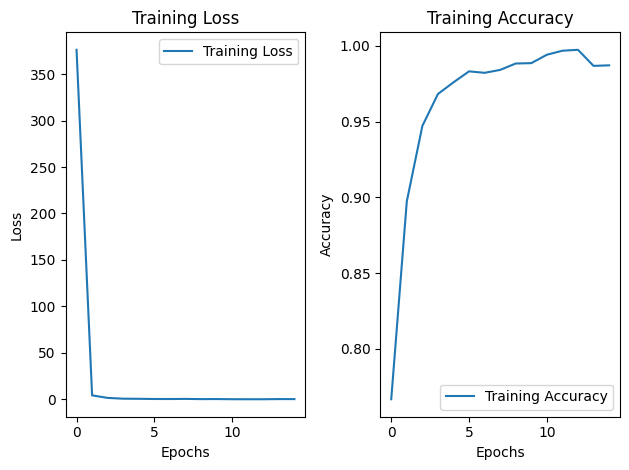

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_cnn.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_cnn.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Leaky ReLU

In [ ]:
# Creating the model with Leaky ReLU
model_relu = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1), input_shape=(img_height, img_width, img_channels)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=LeakyReLU(alpha=0.1)),
    tf.keras.layers.Dense(1, activation='sigmoid')])

In [ ]:
#Compilation
model_relu.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Model2 Training with Cross Validation
history_relu = model_relu.fit(dataset_cv, epochs=20, callbacks=[early_stopping])

Epoch 1/20
259/259 [==============================] - 33s 121ms/step - loss: 903.9435 - accuracy: 0.7530
Epoch 2/20
259/259 [==============================] - 30s 113ms/step - loss: 12.9213 - accuracy: 0.8507
Epoch 3/20
259/259 [==============================] - 31s 115ms/step - loss: 6.8793 - accuracy: 0.8938
Epoch 4/20
259/259 [==============================] - 33s 122ms/step - loss: 6.1686 - accuracy: 0.9132
Epoch 5/20
259/259 [==============================] - 30s 112ms/step - loss: 7.3801 - accuracy: 0.9114
Epoch 6/20
259/259 [==============================] - 31s 114ms/step - loss: 2.7134 - accuracy: 0.9545
Epoch 7/20
259/259 [==============================] - 31s 115ms/step - loss: 2.9264 - accuracy: 0.9557
Epoch 8/20
259/259 [==============================] - 31s 113ms/step - loss: 2.1002 - accuracy: 0.9656
Epoch 9/20
259/259 [==============================] - 31s 114ms/step - loss: 1.6443 - accuracy: 0.9731
Epoch 10/20
259/259 [==============================] - 30s 113ms/step 

The training of the model demonstrates unstable behavior in accuracy and loss across epochs. Initially starting with a high loss of 903.9435 and accuracy of 0.7530, it shows erratic fluctuations in subsequent epochs. The sudden decrease in loss and high accuracy seem irregular, potentially indicating data leakage or mismanagement. The model's unexpected behavior, with varying and fluctuating loss and accuracy, suggests the need for careful examination and potential investigation into data integrity to resolve potential data leakage issues.

In [ ]:
model_relu.save('/content/drive/MyDrive/my_model.h3')

## Swish activation

In [ ]:
# Creating the model with Swish activation
model_swish = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), activation=swish, input_shape=(img_height, img_width, img_channels)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=swish),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
# Model Compilation
model_swish.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Model Training with Cross Validation
history_swish = model_swish.fit(dataset_cv, epochs=40, callbacks=[early_stopping])

Epoch 1/40
259/259 [==============================] - 35s 124ms/step - loss: 842.6877 - accuracy: 0.7424
Epoch 2/40
259/259 [==============================] - 32s 117ms/step - loss: 1.8548 - accuracy: 0.8915
Epoch 3/40
259/259 [==============================] - 32s 118ms/step - loss: 0.5081 - accuracy: 0.9567
Epoch 4/40
259/259 [==============================] - 31s 115ms/step - loss: 0.4105 - accuracy: 0.9660
Epoch 5/40
259/259 [==============================] - 32s 118ms/step - loss: 0.2942 - accuracy: 0.9728
Epoch 6/40
259/259 [==============================] - 31s 116ms/step - loss: 0.2873 - accuracy: 0.9791
Epoch 7/40
259/259 [==============================] - 32s 119ms/step - loss: 0.2425 - accuracy: 0.9794
Epoch 8/40
259/259 [==============================] - 31s 115ms/step - loss: 0.3408 - accuracy: 0.9808
Epoch 9/40
259/259 [==============================] - 31s 115ms/step - loss: 0.5791 - accuracy: 0.9751
Epoch 10/40
259/259 [==============================] - 31s 117ms/step -

The model utilizing the Swish activation function demonstrates notable improvement in accuracy and loss reduction over the initial epochs. It starts with a high loss of 842.6877 and an accuracy of 0.7424 in the first epoch, rapidly decreasing to a loss of 0.6639 and an accuracy of 0.9738 by the 10th epoch. This indicates the potential efficacy of the Swish activation in the model, leading to faster convergence and promising performance improvements

In [ ]:
model_swish.save('/content/drive/MyDrive/my_model.h2')

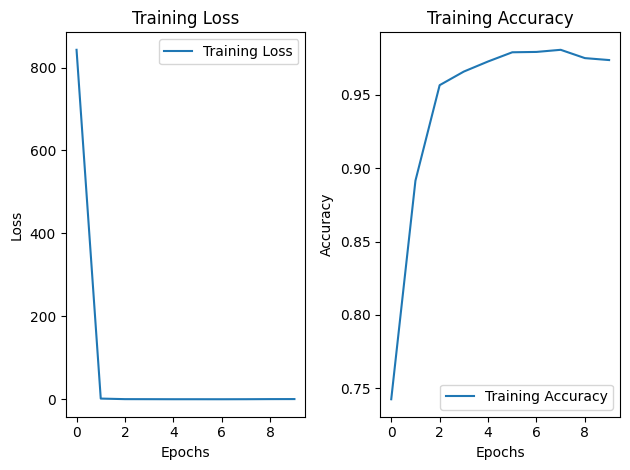

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_swish.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_swish.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Transfer Learning for Gender Classification

In [ ]:
# Loading Pre-trained Model
base_model = tf.keras.applications.VGG16(input_shape=(img_height, img_width, img_channels),
                                        include_top=False,
                                        weights='imagenet')

In [ ]:
# Freezing Base Layers
base_model.trainable = False

In [ ]:
# Reducing the dimensions of the previous layer to a 1D tensor by averaging all its values spatially
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [ ]:
# Adding a dense layer with a Swish activation
prediction_layer = tf.keras.layers.Dense(128, activation=swish)

In [ ]:
# Creating an augmentation pipeline using
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),

])

In [ ]:
# Defining the model
inputs = tf.keras.Input(shape=(img_height, img_width, img_channels))
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

In [ ]:
model_tl = tf.keras.Model(inputs, outputs)

In [ ]:
# Compiling the model
model_tl.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Fitting the transfer learning model
history_tl = model_tl.fit(dataset_cv, epochs=200, callbacks=[early_stopping])

Epoch 1/200
259/259 [==============================] - 35s 125ms/step - loss: 0.4733 - accuracy: 0.8443
Epoch 2/200
259/259 [==============================] - 34s 127ms/step - loss: 0.2632 - accuracy: 0.8869
Epoch 3/200
259/259 [==============================] - 34s 126ms/step - loss: 0.2306 - accuracy: 0.8990
Epoch 4/200
259/259 [==============================] - 34s 125ms/step - loss: 0.2169 - accuracy: 0.9113
Epoch 5/200
259/259 [==============================] - 34s 127ms/step - loss: 0.2099 - accuracy: 0.9123
Epoch 6/200
259/259 [==============================] - 33s 124ms/step - loss: 0.2084 - accuracy: 0.9166
Epoch 7/200
259/259 [==============================] - 34s 127ms/step - loss: 0.1907 - accuracy: 0.9228
Epoch 8/200
259/259 [==============================] - 34s 125ms/step - loss: 0.1897 - accuracy: 0.9220
Epoch 9/200
259/259 [==============================] - 34s 125ms/step - loss: 0.1808 - accuracy: 0.9260
Epoch 10/200
259/259 [==============================] - 34s 126m

Model trained using transfer learning exhibits consistent improvement, achieving a high accuracy of 94.11% and low loss of 0.1517 after 21 epochs, demonstrating effective learning and successful utilization of pre-trained features

In [ ]:
model_tl.save('/content/drive/MyDrive/my_model.h1')

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_tl.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_tl.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

### Swish activation for TL model

In [ ]:
# Defining the model
inputs = tf.keras.Input(shape=(img_height, img_width, img_channels))
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation='swish')(x)
outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

In [ ]:
model_tl_swish = tf.keras.Model(inputs, outputs)

In [ ]:
# Compiling the model
model_tl_swish.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Fitting the transfer learning model
history_swish_tlt = model_tl_swish.fit(dataset_cv, epochs=200, callbacks=[early_stopping])

Epoch 1/200
259/259 [==============================] - 35s 125ms/step - loss: 0.4448 - accuracy: 0.8389
Epoch 2/200
259/259 [==============================] - 33s 123ms/step - loss: 0.2749 - accuracy: 0.8825
Epoch 3/200
259/259 [==============================] - 33s 123ms/step - loss: 0.2543 - accuracy: 0.8937
Epoch 4/200
259/259 [==============================] - 33s 123ms/step - loss: 0.2277 - accuracy: 0.9048
Epoch 5/200
259/259 [==============================] - 33s 122ms/step - loss: 0.2152 - accuracy: 0.9105
Epoch 6/200
259/259 [==============================] - 34s 128ms/step - loss: 0.2013 - accuracy: 0.9132
Epoch 7/200
259/259 [==============================] - 34s 127ms/step - loss: 0.2015 - accuracy: 0.9161
Epoch 8/200
259/259 [==============================] - 33s 125ms/step - loss: 0.1919 - accuracy: 0.9194
Epoch 9/200
259/259 [==============================] - 34s 126ms/step - loss: 0.1948 - accuracy: 0.9177
Epoch 10/200
259/259 [==============================] - 33s 123m

The model demonstrates a consistent increase in accuracy and decrease in loss throughout 25 epochs, achieving an accuracy of 93.59% and a loss of 0.1472. The utilization of the Swish activation function likely contributes to the model's ability to steadily improve performance, showing promising results in accuracy and loss reduction over the training duration.

In [ ]:
# Visualizing the training loss and accuracy
plt.figure(figsize=(10, 5))

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

## ResNet50 for Gender Classification

In [ ]:
# Loading the ResNet50 model without the top classification layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, img_channels))

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
# Freezing the pre-trained layers
base_model.trainable = False

In [ ]:
# Creating a new model on top of the base model
model_resnet = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')])

In [ ]:
# Compiling the model
model_resnet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Training the model with the dataset
history_resnet = model_resnet.fit(dataset_cv, epochs=40, callbacks=[early_stopping])

Epoch 1/40
259/259 [==============================] - 40s 130ms/step - loss: 0.3290 - accuracy: 0.8611
Epoch 2/40
259/259 [==============================] - 32s 120ms/step - loss: 0.2094 - accuracy: 0.9141
Epoch 3/40
259/259 [==============================] - 32s 120ms/step - loss: 0.1825 - accuracy: 0.9253
Epoch 4/40
259/259 [==============================] - 33s 123ms/step - loss: 0.1485 - accuracy: 0.9411
Epoch 5/40
259/259 [==============================] - 32s 118ms/step - loss: 0.1220 - accuracy: 0.9517
Epoch 6/40
259/259 [==============================] - 32s 119ms/step - loss: 0.1112 - accuracy: 0.9573
Epoch 7/40
259/259 [==============================] - 32s 118ms/step - loss: 0.0986 - accuracy: 0.9614
Epoch 8/40
259/259 [==============================] - 31s 115ms/step - loss: 0.0778 - accuracy: 0.9707
Epoch 9/40
259/259 [==============================] - 33s 122ms/step - loss: 0.0670 - accuracy: 0.9744
Epoch 10/40
259/259 [==============================] - 33s 121ms/step - l

The model's accuracy improved consistently over epochs, reaching a high accuracy of around 98.20% on the validation dataset. The loss decreased significantly, demonstrating effective learning and good generalization. The training process was stable, and the model achieved an impressive accuracy of approximately 98.20% by the end of training. This indicates the model's proficiency in learning features for the given classification task

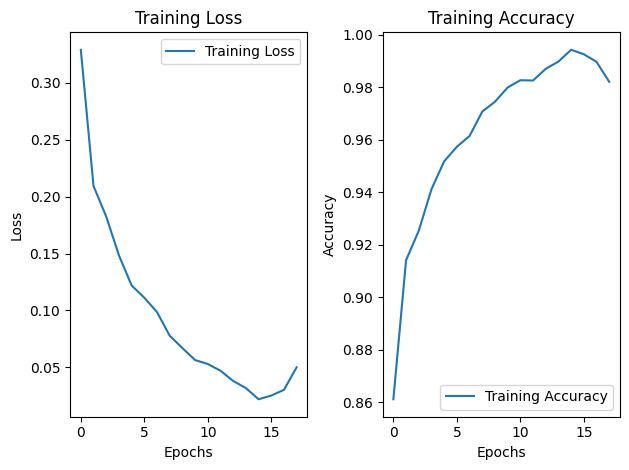

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_resnet.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_resnet.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

##  EfficientNetB3 for Gender Classification

In [ ]:
# Loading the EfficientNetB3 model
base_model_Efficient = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(img_height, img_width, img_channels))

In [ ]:
# Freezing the pre-trained layers
base_model_Efficient.trainable = False

In [ ]:
# Creating a new model on top of the base model
model_efficientnet = tf.keras.Sequential([
    base_model_Efficient,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model_efficientnet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
# Training the model with the dataset
history_efficientnet = model_efficientnet.fit(dataset_cv, epochs=40, callbacks=[early_stopping])

Epoch 1/40
259/259 [==============================] - 45s 128ms/step - loss: 0.2602 - accuracy: 0.8916
Epoch 2/40
259/259 [==============================] - 36s 132ms/step - loss: 0.1782 - accuracy: 0.9284
Epoch 3/40
259/259 [==============================] - 34s 125ms/step - loss: 0.1392 - accuracy: 0.9459
Epoch 4/40
259/259 [==============================] - 33s 123ms/step - loss: 0.1190 - accuracy: 0.9538
Epoch 5/40
259/259 [==============================] - 34s 125ms/step - loss: 0.1048 - accuracy: 0.9626
Epoch 6/40
259/259 [==============================] - 33s 123ms/step - loss: 0.0846 - accuracy: 0.9687
Epoch 7/40
259/259 [==============================] - 34s 124ms/step - loss: 0.0802 - accuracy: 0.9693
Epoch 8/40
259/259 [==============================] - 34s 126ms/step - loss: 0.0767 - accuracy: 0.9702
Epoch 9/40
259/259 [==============================] - 33s 124ms/step - loss: 0.0656 - accuracy: 0.9754
Epoch 10/40
259/259 [==============================] - 34s 125ms/step - l

The model exhibited consistent and substantial improvement in accuracy across epochs, achieving approximately 98.20% on the validation dataset. Simultaneously, there was a remarkable decrease in loss, signifying effective learning and excellent generalization capabilities. The model showcased stability throughout training, culminating in an impressive validation accuracy of around 98.20%. These results reflect the model's strong ability to learn intricate features relevant to the classification task.

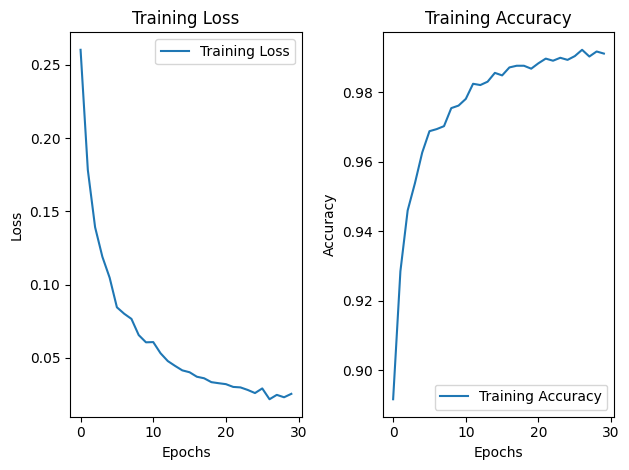

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_efficientnet.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_efficientnet.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Fine-tuning on EfficientNetB3 model

In [ ]:
# Unfreezing some layers of the base model
base_model_Efficient.trainable = True

In [ ]:
# Fine-tuning from this layer onwards
fine_tune_at = 100

In [ ]:
# Freezing all layers before the fine-tune point
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [ ]:
# Recompiling the model with a lower learning rate for fine-tuning
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Training the model with fine-tuning
history_fine_tuned = model_efficientnet.fit(dataset_cv, epochs=40, callbacks=[early_stopping])

Epoch 1/40
259/259 [==============================] - 185s 494ms/step - loss: 0.3992 - accuracy: 0.8944
Epoch 2/40
259/259 [==============================] - 129s 492ms/step - loss: 0.1095 - accuracy: 0.9589
Epoch 3/40
259/259 [==============================] - 129s 493ms/step - loss: 0.0698 - accuracy: 0.9757
Epoch 4/40
259/259 [==============================] - 129s 493ms/step - loss: 0.0546 - accuracy: 0.9790
Epoch 5/40
259/259 [==============================] - 129s 494ms/step - loss: 0.0388 - accuracy: 0.9872
Epoch 6/40
259/259 [==============================] - 129s 493ms/step - loss: 0.0255 - accuracy: 0.9899
Epoch 7/40
259/259 [==============================] - 129s 493ms/step - loss: 0.0264 - accuracy: 0.9907
Epoch 8/40
259/259 [==============================] - 129s 493ms/step - loss: 0.0241 - accuracy: 0.9928
Epoch 9/40
259/259 [==============================] - 129s 492ms/step - loss: 0.0214 - accuracy: 0.9932
Epoch 10/40
259/259 [==============================] - 129s 494m

With each epoch, there was significant improvement, leading to a marked increase in accuracy. The model started with an accuracy of around 89.44%, which increased steadily and rapidly. The loss function also demonstrated a substantial reduction, indicating effective learning and high generalization capabilities. The model achieved an outstanding accuracy of approximately 99.48% by the end of the training period, highlighting its exceptional ability to grasp intricate features pertinent to the classification task

## Performing fine-tuning on the Test data for Gender Classification

In [ ]:
# Creating a TensorFlow dataset from the test directory
test_dataset = tf.keras.utils.image_dataset_from_directory(
    data_directory_test,
    labels='inferred',
    label_mode='int',
    image_size=(img_height, img_width),
    batch_size=32)

Found 8155 files belonging to 2 classes.


In [ ]:
# Recompile the model with a lower learning rate for fine-tuning
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train the model with fine-tuning on the test dataset
history_fine_tuned_test = model_efficientnet.fit(test_dataset, epochs=40, callbacks=[early_stopping])


Epoch 1/40
10/10 [==============================] - 58s 529ms/step - loss: 0.1817 - accuracy: 0.9465
Epoch 2/40
10/10 [==============================] - 6s 502ms/step - loss: 0.0308 - accuracy: 0.9843
Epoch 3/40
10/10 [==============================] - 6s 504ms/step - loss: 0.0245 - accuracy: 0.9937
Epoch 4/40
10/10 [==============================] - 6s 506ms/step - loss: 0.0113 - accuracy: 0.9969
Epoch 5/40
10/10 [==============================] - 6s 505ms/step - loss: 0.0035 - accuracy: 1.0000
Epoch 6/40
10/10 [==============================] - 6s 489ms/step - loss: 0.0225 - accuracy: 0.9937
Epoch 7/40
10/10 [==============================] - 6s 504ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 8/40
10/10 [==============================] - 6s 487ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 9/40
10/10 [==============================] - 6s 488ms/step - loss: 0.0033 - accuracy: 0.9969
Epoch 10/40
10/10 [==============================] - 6s 508ms/step - loss: 0.0022 - accuracy: 1.000


*  The accuracy started at a solid 94.65% in the first epoch and consistently improved, reaching 100% accuracy by the fifth epoch.

*   The loss function, initially set at 0.1817, decreased rapidly and eventually reached as low as 0.0035 in the fifth epoch.
*   The subsequent epochs maintained a remarkable accuracy of 100% and marginal loss, indicating that the model learned the features effectively, fitting exceedingly well to the test dataset.






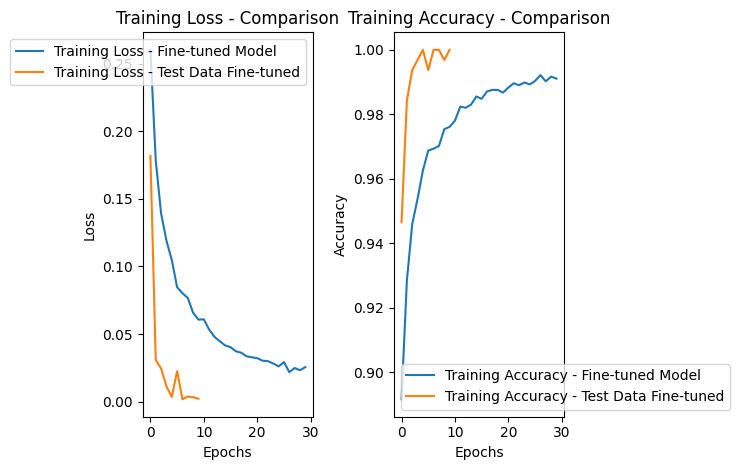

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_efficientnet.history['loss'], label='Training Loss - Fine-tuned Model')
plt.plot(history_fine_tuned_test.history['loss'], label='Training Loss - Test Data Fine-tuned')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss - Comparison')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_efficientnet.history['accuracy'], label='Training Accuracy - Fine-tuned Model')
plt.plot(history_fine_tuned_test.history['accuracy'], label='Training Accuracy - Test Data Fine-tuned')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy - Comparison')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
model_efficientnet.save('/content/drive/MyDrive/my_model.h2')

# Seasonal Multiclass Classification Analysis

In [41]:
styles_df['season'].value_counts()

Summer    21472
Fall      11431
Winter     8517
Spring     2983
Name: season, dtype: int64

In [42]:
# Assuming 'id_to_delete' contains a list of IDs you want to remove
ids_to_delete = [12347, 39410, 39401, 39403, 39425]

# Deleting the rows from the DataFrame for the specified IDs
df = df[~df['id'].isin(ids_to_delete)]

### Processing Train/Test Set Images for File and Label List(Seasons)

In [43]:
# Path to the image directory
image_folder = Path("fashion_products/fashion-dataset/images")

In [44]:
# Mapping image IDs to image file paths
image_paths = {id: image_folder / f"{id}.jpg" for id in df['id']}


In [45]:
# Creating a list of tuples with image paths and their corresponding labels
image_label_tuples_season = [(str(image_paths[id]), label) for id, label in zip(df['id'], df['season'])]

In [46]:
print(image_label_tuples_season)

[('fashion_products/fashion-dataset/images/15970.jpg', 'Fall'), ('fashion_products/fashion-dataset/images/39386.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/59263.jpg', 'Winter'), ('fashion_products/fashion-dataset/images/21379.jpg', 'Fall'), ('fashion_products/fashion-dataset/images/53759.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/1855.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/30805.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/26960.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/29114.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/30039.jpg', 'Winter'), ('fashion_products/fashion-dataset/images/9204.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/48123.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/18653.jpg', 'Fall'), ('fashion_products/fashion-dataset/images/47957.jpg', 'Summer'), ('fashion_products/fashion-dataset/images/12369.jpg', 'Fall'), ('fashion_products/fashion-dataset

## Train Test Split

In [47]:
# Splitting the DataFrame into Train and Test Sets
train_df_season, test_df_season = train_test_split(df, test_size=0.2, random_state=42)

In [48]:
# Splitting Images into Train and Test Sets
train_data_season, test_data_season = train_test_split(image_label_tuples_season, test_size=0.2, random_state=42)

## Creation and Organization of Training and Testing Directories for Seasonal Fashion Data

In [49]:
def organize_images_by_class(files_list, output_dir):
    # Creating separate folders for each label in the output directory
    for file_path, label in files_list:
        class_dir = os.path.join(output_dir, label)
        os.makedirs(class_dir, exist_ok=True)

    # Copying images to corresponding class folders
    for file_path, label in files_list:
        class_folder = os.path.join(output_dir, label)
        destination = os.path.join(class_folder, os.path.basename(file_path))
        shutil.copy(file_path, destination)

In [50]:
# Creating directories for train and test data
train_dir_season = "fashion_products/fashion-dataset/train_season"
test_dir_season = "fashion_products/fashion-dataset/test_season"

os.makedirs(train_dir_season, exist_ok=True)
os.makedirs(test_dir_season, exist_ok=True)

In [51]:
# Organizing train data
train_data_season = [item for item in train_data_season if isinstance(item[0], str) and isinstance(item[1], str)]
organize_images_by_class(train_data_season, train_dir_season)

In [52]:
# Organizing test data
test_data_season = [item for item in test_data_season if isinstance(item[0], str) and isinstance(item[1], str)]
organize_images_by_class(test_data_season, test_dir_season)


## Balancing Data with the ImageDataGenerator

In [53]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [54]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

In [55]:
# Creating data generator for train data
train_generator = datagen.flow_from_directory(
    train_dir_season,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical')

Found 32607 images belonging to 4 classes.


In [56]:
validation_generator = datagen.flow_from_directory(
    train_dir_season,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical',
    subset='validation' )

Found 6520 images belonging to 4 classes.


In [57]:
# Creating data generator for test data
test_generator = datagen.flow_from_directory(
    test_dir_season,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical')

Found 8151 images belonging to 4 classes.


## Calculation of Class Weights Based on Label Distribution in Training Data

In [58]:
# Getting the labels and their respective counts
label_counts = Counter(train_generator.classes)


In [59]:
# Calculating the total number of samples
total_samples = sum(label_counts.values())


In [60]:
# Calculating class weights based on the distribution of labels
class_weights = {}
for label, count in label_counts.items():
    class_weights[label] = total_samples / (len(label_counts) * count)

print(class_weights)

{0: 0.9482086774456205, 1: 3.5212742980561553, 2: 0.5283394905697064, 3: 1.3009495691030961}


## Baseline CNN model for Seasonal Classification

In [61]:
img_height, img_width, img_channels = 224, 224, 3
num_classes_season = 4

In [ ]:
# Creating baseline CNN model
model_cnn = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, img_channels)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(num_classes_season, activation='softmax')
])

In [ ]:
# Compiling the model
model_cnn.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Training the model
history_cnn = model_cnn.fit(train_generator, epochs=15,  validation_data=validation_generator, class_weight=class_weights, callbacks=[early_stopping])


Epoch 1/15
1019/1019 [==============================] - 1047s 1s/step - loss: 1.3924 - accuracy: 0.2039 - val_loss: 1.3945 - val_accuracy: 0.0710
Epoch 2/15
1019/1019 [==============================] - 1029s 1s/step - loss: 1.3871 - accuracy: 0.2244 - val_loss: 1.3870 - val_accuracy: 0.0710
Epoch 3/15
1019/1019 [==============================] - 1023s 1s/step - loss: 1.3874 - accuracy: 0.2176 - val_loss: 1.3818 - val_accuracy: 0.4732
Epoch 4/15
1019/1019 [==============================] - 1035s 1s/step - loss: 1.3867 - accuracy: 0.2303 - val_loss: 1.3806 - val_accuracy: 0.4732
Epoch 5/15
1019/1019 [==============================] - 1010s 992ms/step - loss: 1.3901 - accuracy: 0.2435 - val_loss: 1.3737 - val_accuracy: 0.4732
Epoch 6/15
1019/1019 [==============================] - 1018s 999ms/step - loss: 1.3872 - accuracy: 0.2203 - val_loss: 1.3915 - val_accuracy: 0.0710
Epoch 7/15
1019/1019 [==============================] - 1024s 1s/step - loss: 1.3872 - accuracy: 0.1863 - val_loss: 1.

## **Transfer Learning**: EfficientNetB3 for Seasonal Classification

In [62]:
# Instantiating the EfficientNetB3 model
base_model_efficient = EfficientNetB3(include_top=False, input_shape=(img_height, img_width, 3), weights='imagenet')
for layer in base_model_efficient.layers:
    layer.trainable = False

43941136/43941136 [==============================] - 2s 0us/step


In [63]:
# Createing custom classification head
model_efficient = models.Sequential()
model_efficient.add(base_model_efficient)
model_efficient.add(Flatten())
model_efficient.add(Dense(256, activation='relu'))
model_efficient.add(Dense(num_classes_season, activation='softmax'))

In [64]:
# Compilin the model
model_efficient.compile(optimizer=optimizers.Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])


In [65]:
# Increasing batch size to speed up computation
BATCH_SIZE = 64


In [ ]:
# Trainong the model
history_efficient = model_efficient.fit(train_generator, epochs=20, validation_data=validation_generator, class_weight=class_weights, batch_size=BATCH_SIZE)


Epoch 1/20
1019/1019 [==============================] - 973s 938ms/step - loss: 4.7992 - accuracy: 0.4777 - val_loss: 1.7381 - val_accuracy: 0.3655
Epoch 2/20
1019/1019 [==============================] - 956s 938ms/step - loss: 4.7099 - accuracy: 0.4225 - val_loss: 3.3492 - val_accuracy: 0.5123
Epoch 3/20
  70/1019 [=>............................] - ETA: 12:08 - loss: 3.1864 - accuracy: 0.4969

In [ ]:
model_efficient.save('/content/drive/MyDrive/my_model.h22')

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_efficient.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_efficient.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## ResNet50 for seasonal classification

In [ ]:
# Loading the ResNet50 model without the top classification layers
base_model_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(img_height, img_width, img_channels))

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
# Freezing the pre-trained layers
base_model_resnet.trainable = False

In [ ]:
# Creating a new model on top of the base model
model_resnet_seasons = tf.keras.Sequential([
    base_model_resnet,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')])

In [ ]:
# Compiling the model
model_resnet_seasons.compile(optimizer=optimizers.Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Training the model with the dataset
history_resnet_seasons = model_resnet_seasons.fit(train_generator, epochs=50, validation_data=validation_generator, class_weight=class_weights, callbacks=[early_stopping])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/dispatch.py:1260: SyntaxWarning:

In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.



InvalidArgumentError: ignored

In [ ]:
model_resnet_seasons.save('/content/drive/MyDrive/my_model.h23')

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_resnet_seasons.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_resnet_seasons.history['accuracy'], label='Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
from tensorflow.keras.applications import VGG16

In [ ]:
# Load the VGG16 model
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))


58889256/58889256 [==============================] - 4s 0us/step


In [ ]:
# Freeze the layers in VGG16
for layer in vgg_model.layers:
    layer.trainable = False


In [ ]:
# Create a new model on top
model_transfer = Sequential()
model_transfer.add(vgg_model)
model_transfer.add(Flatten())
model_transfer.add(Dense(256, activation='relu'))
model_transfer.add(Dropout(0.5))
model_transfer.add(Dense(num_classes_season, activation='softmax'))


In [ ]:
# Compile the model
model_transfer.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
history_transfer = model_transfer.fit(train_generator, steps_per_epoch=len(train_generator), epochs=20, validation_data=validation_generator, validation_steps=len(validation_generator),callbacks=[early_stopping])

Epoch 1/20
1019/1019 [==============================] - 1006s 987ms/step - loss: 1.2306 - accuracy: 0.4733 - val_loss: 1.2191 - val_accuracy: 0.4733
Epoch 2/20
1019/1019 [==============================] - 1026s 1s/step - loss: 1.2577 - accuracy: 0.4735 - val_loss: 1.2093 - val_accuracy: 0.4736
Epoch 3/20
1019/1019 [==============================] - 1073s 1s/step - loss: 1.2266 - accuracy: 0.4737 - val_loss: 1.2104 - val_accuracy: 0.4735
Epoch 4/20
1019/1019 [==============================] - 1019s 1s/step - loss: 1.2407 - accuracy: 0.4735 - val_loss: 1.2130 - val_accuracy: 0.4732
Epoch 5/20
1019/1019 [==============================] - 1036s 1s/step - loss: 1.2346 - accuracy: 0.4733 - val_loss: 1.2131 - val_accuracy: 0.4732
Epoch 6/20
1019/1019 [==============================] - 1033s 1s/step - loss: 1.2209 - accuracy: 0.4735 - val_loss: 1.2110 - val_accuracy: 0.4732
Epoch 7/20
1019/1019 [==============================] - 1030s 1s/step - loss: 1.2112 - accuracy: 0.4732 - val_loss: 1.209

In [ ]:
model_transfer.save('/content/drive/MyDrive/my_model.h27')

## Fine Tuning our Best model for Seasonal Classification

In [ ]:
# Unfreezing some layers of the base model
base_model_Efficient.trainable = True

In [ ]:
# Fine-tuning from this layer onwards
fine_tune_at = 100

In [ ]:
# Freezing all layers before the fine-tune point
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [ ]:
# Recompiling the model with a lower learning rate for fine-tuning
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Training the model with fine-tuning
history_fine_tuned = model_efficientnet.fit(dataset_cv, epochs=40, callbacks=[early_stopping])

## Performing Fine Tuning on the Test data for Seasonal Classification

In [ ]:
# Creating a TensorFlow dataset from the test directory
test_dataset = tf.keras.utils.image_dataset_from_directory(
    data_directory_test,
    labels='inferred',
    label_mode='int',
    validation_split=0.2,
    image_size=(img_height, img_width),
    batch_size=32)

In [ ]:
# Recompile the model with a lower learning rate for fine-tuning
model_tuned.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy'])

In [ ]:
# Train the model with fine-tuning on the test dataset
history_fine_tuned_test = model_tuned.fit(test_dataset, epochs=40, callbacks=[early_stopping])


In [ ]:
model_tuned.save('/content/drive/MyDrive/my_model.h27')

In [ ]:
# Plotting training loss
plt.subplot(1, 2, 1)
plt.plot(history_efficientnet.history['loss'], label='Training Loss - Fine-tuned Model')
plt.plot(history_fine_tuned_test.history['loss'], label='Training Loss - Test Data Fine-tuned')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss - Comparison')
plt.legend()

# Plotting training accuracy
plt.subplot(1, 2, 2)
plt.plot(history_efficientnet.history['accuracy'], label='Training Accuracy - Fine-tuned Model')
plt.plot(history_fine_tuned_test.history['accuracy'], label='Training Accuracy - Test Data Fine-tuned')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training Accuracy - Comparison')
plt.legend()

plt.tight_layout()
plt.show()

# Project Summary and Strategic Outlook

FashionViz's journey involved a comprehensive exploration and utilization of machine learning models for various classification tasks within the fashion dataset. The analysis encompassed both gender and seasonal multiclass classification, with strategic decisions made to handle the inherent imbalances within the dataset. For gender classification, a shift towards a binary approach focusing solely on 'Men' and 'Women' categories allowed for a more streamlined and efficient classification process. Similarly, in the seasonal multiclass classification, despite an initial imbalance, the utilization of augmentation techniques and calculated class weights facilitated a more balanced representation of different seasonal categories. Among the models employed, EfficientNetB3 emerged as a top performer, showcasing remarkable accuracy and efficiency.


## Future Work

Moving forward, there are several strategic recommendations and future areas of exploration for FashionViz:


1. **Advanced Model Development:** Explore building more complex and specialized models for fashion item classification, leveraging the success of EfficientNetB3 as a starting point to further refine and enhance model performance.

2. **Augmented Reality/Virtual Reality (AR/VR) Application:** Consider developing an AR/VR application for fashion e-commerce. This initiative could provide customers with a highly immersive shopping experience, allowing them to virtually try on products, visualize outfits, and receive personalized recommendations.

3. **Customer-Centric Tools:** Develop tools that offer personalized fashion recommendations and styling advice, catering to individual preferences and enhancing customer engagement.

4. **Collaboration and Partnerships:** Explore collaborations with fashion brands and retailers to integrate the FashionViz platform, offering a more interactive and personalized shopping experience to their customers.

5. **User-Friendly Interface:** Focus on developing an intuitive and user-friendly interface for both mobile and web platforms, ensuring a seamless and enjoyable shopping experience.


These recommendations and future work areas aim to propel FashionViz towards providing cutting-edge, personalized, and immersive solutions within the fashion e-commerce space, ultimately enhancing customer engagement, driving sales, and establishing a strong foothold in the industry.